In [2]:
import pandas as pd
import torch 
import torch.nn.functional as F
import torchvision 
import torchvision.transforms as transforms
import numpy as np

# import tensorflow as tf
# import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
from PIL import Image

### Load Images

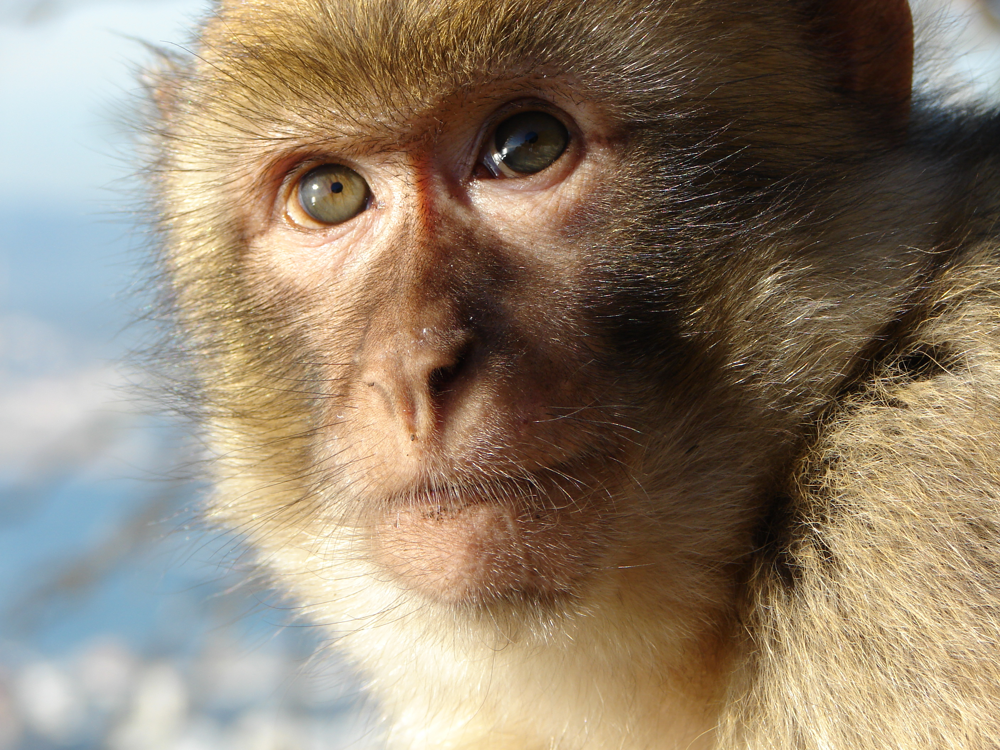

In [3]:
macaque = Image.open('../images/Gibraltar_Barbary_Macaque.jpg')
macaque

In [4]:
img_macaque = np.asarray(macaque)

In [5]:
img_macaque.shape

(2112, 2816, 3)

In [6]:
img_macaque = np.transpose(img_macaque, (2, 0, 1))

### Reshape images

In [14]:
preprocess = transforms.Compose([
    transforms.Resize((64, 64)), 
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406], # using ImageNet Statistics
        std=[0.229, 0.224, 0.225]
    )
])


In [15]:
img_tensor = preprocess(macaque)

In [16]:
img_tensor.shape

torch.Size([3, 64, 64])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8781574..2.535425].


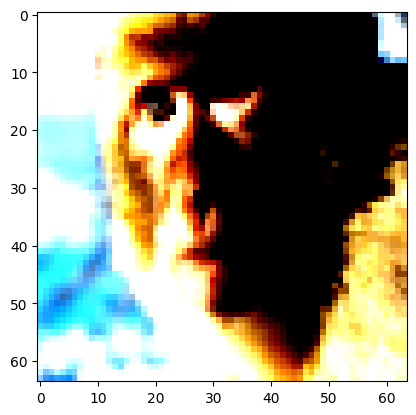

In [17]:
plt.imshow(np.transpose(img_tensor, (1, 2, 0)))
# plt.imshow(img_tensor)

In [18]:
# img_tensor.shape

In [19]:
img_tensor = img_tensor.unsqueeze(0)
img_tensor.shape

torch.Size([1, 3, 64, 64])

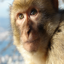

In [20]:
macaque2 = macaque.resize((64, 64))
macaque2

In [67]:
t = np.asarray(macaque2)
img_tensor2 = np.transpose(t, (2, 0, 1))
img_tensor2 = torch.tensor(img_tensor2, dtype=torch.float32).unsqueeze(0)
img_tensor2.shape

torch.Size([1, 3, 64, 64])

In [68]:
img_tensor2 = img_tensor2 / 255 # normalize image

### Get ImageNet Dictionary

In [23]:
import requests
import json
import ast

imagenet_dct_url = "https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a/raw"
resp = requests.get(imagenet_dct_url)

In [24]:
dct_imagenet = ast.literal_eval(resp.text)

In [25]:
dct_imagenet[0]

'tench, Tinca tinca'

### Load ImageNet

In [ ]:
# imagenet = tfds.image.Imagenet2012()
# datasets = imagenet.as_dataset()

### Load the pretrained model

In [73]:
model = torchvision.models.vgg19(weights = 'IMAGENET1K_V1') # Downloading model manually first

In [74]:
model.eval()

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

In [14]:
# dummy_img = torch.rand(1, 3, 64, 64)
# output = model(dummy_img)

In [75]:
def get_top_image_classification(img_tensors, top_k: int = 5):
    # compute prediction
    output = model(img_tensors)
    probs = F.softmax(output)
    topk_prob, topk_catid = torch.topk(probs, top_k)
    
    # convert prediction classes to class name
    top_results = []
    batch_size = topk_prob.shape[0]
    for batch_idx in range(batch_size):
        batch_res = []
        for prob, catid in zip(topk_prob[batch_idx], topk_catid[batch_idx]):
            idx = catid.item()
            batch_res.append((idx, dct_imagenet[idx], prob.item()))
        top_results.append(batch_res)
    
    return top_results

In [79]:
get_top_image_classification(img_tensor, 15)

/var/folders/ft/zzyxfrm96v3dk85k23qrmdww0000gp/T/ipykernel_92170/2264329566.py:4: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  probs = F.softmax(output)


[[(373, 'macaque', 0.6427314877510071),
  (380, 'titi, titi monkey', 0.13852931559085846),
  (378, 'capuchin, ringtail, Cebus capucinus', 0.10832221806049347),
  (377, 'marmoset', 0.09202801436185837),
  (370, 'guenon, guenon monkey', 0.008744165301322937),
  (371, 'patas, hussar monkey, Erythrocebus patas', 0.008046411909162998),
  (381, 'spider monkey, Ateles geoffroyi', 0.0008809952414594591),
  (374, 'langur', 0.000717348710168153),
  (382, 'squirrel monkey, Saimiri sciureus', 6.0053984007879535e-09),
  (379, 'howler monkey, howler', 4.997752212076989e-10),
  (375, 'colobus, colobus monkey', 3.0161795283589754e-10),
  (367, 'chimpanzee, chimp, Pan troglodytes', 5.84052901528298e-12),
  (368, 'gibbon, Hylobates lar', 4.444596600483575e-12),
  (369,
   'siamang, Hylobates syndactylus, Symphalangus syndactylus',
   3.0657787506577217e-12),
  (365,
   'orangutan, orang, orangutang, Pongo pygmaeus',
   1.990827641629167e-12)]]

In [80]:
get_top_image_classification(img_tensor2, 15)

/var/folders/ft/zzyxfrm96v3dk85k23qrmdww0000gp/T/ipykernel_92170/2264329566.py:4: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  probs = F.softmax(output)


[[(373, 'macaque', 0.9136132001876831),
  (374, 'langur', 0.029588958248496056),
  (378, 'capuchin, ringtail, Cebus capucinus', 0.02698543481528759),
  (372, 'baboon', 0.01683611050248146),
  (371, 'patas, hussar monkey, Erythrocebus patas', 0.006738096475601196),
  (380, 'titi, titi monkey', 0.0027443128637969494),
  (370, 'guenon, guenon monkey', 0.0026734392158687115),
  (365,
   'orangutan, orang, orangutang, Pongo pygmaeus',
   0.00027527360362000763),
  (368, 'gibbon, Hylobates lar', 0.00015315994096454233),
  (376, 'proboscis monkey, Nasalis larvatus', 9.878239507088438e-05),
  (568, 'fur coat', 7.409580575767905e-05),
  (424, 'barbershop', 6.229319114936516e-05),
  (366, 'gorilla, Gorilla gorilla', 3.774858851102181e-05),
  (715, 'pickelhaube', 3.1801995646674186e-05),
  (367, 'chimpanzee, chimp, Pan troglodytes', 2.0944296920788474e-05)]]